# Lab14: Flappy bird using RL
---
111062117

In this lab, we will modify the update rule from Q-learning to SARSA (using the same episodes) to train an agent to play the "Flappy Bird" game.

In [30]:
from ple.games.flappybird import FlappyBird
from ple import PLE
import matplotlib.pyplot as plt
import os
import numpy as np

%matplotlib inline
os.environ["SDL_VIDEODRIVER"] = "dummy"  # this line disable pop-out window
game = FlappyBird()
env = PLE(game, fps=30, display_screen=False)  # environment interface to game
env.reset_game()

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


In [31]:
# return a dictionary whose key is action description and value is action index
print(game.actions)
# return a list of action index (include None)
print(env.getActionSet())

{'up': 119}
[119, None]


In [32]:
# a dictionary describe state
'''
    player y position.
    players velocity.
    next pipe distance to player
    next pipe top y position
    next pipe bottom y position
    next next pipe distance to player
    next next pipe top y position
    next next pipe bottom y position
'''
game.getGameState()

{'player_y': 256,
 'player_vel': 0,
 'next_pipe_dist_to_player': 309.0,
 'next_pipe_top_y': 144,
 'next_pipe_bottom_y': 244,
 'next_next_pipe_dist_to_player': 453.0,
 'next_next_pipe_top_y': 160,
 'next_next_pipe_bottom_y': 260}

In [33]:
import math
import copy
from collections import defaultdict

MIN_EXPLORING_RATE = 0.01
MIN_LEARNING_RATE = 0.5

In [34]:
class Q_Agent:

    def __init__(self,
                 bucket_range_per_feature,
                 num_action,
                 t=0,
                 discount_factor=0.99):
        self.update_parameters(t)  # init explore rate and learning rate
        self.q_table = defaultdict(lambda: np.zeros(num_action))
        self.discount_factor = discount_factor
        self.num_action = num_action

        # how to discretize each feature in a state
        # the higher each value, less time to train but with worser performance
        # e.g. if range = 2, feature with value 1 is equal to feature with value 0 bacause int(1/2) = int(0/2)
        self.bucket_range_per_feature = bucket_range_per_feature

    def select_action(self, state):
        # epsilon-greedy
        state_idx = self.get_state_idx(state)
        if np.random.rand() < self.exploring_rate:
            action = np.random.choice(num_action)  # Select a random action
        else:
            action = np.argmax(
                self.q_table[state_idx])  # Select the action with the highest q
        return action

    def update_policy(self, state, action, reward, state_prime):
        state_idx = self.get_state_idx(state)
        state_prime_idx = self.get_state_idx(state_prime)
        # Update Q_value using Q-learning update rule
        best_q = np.max(self.q_table[state_prime_idx])
        self.q_table[state_idx][action] += self.learning_rate * (
            reward + self.discount_factor * best_q - self.q_table[state_idx][action])

    def get_state_idx(self, state):
        # instead of using absolute position of pipe, use relative position
        state = copy.deepcopy(state)
        state['next_next_pipe_bottom_y'] -= state['player_y']
        state['next_next_pipe_top_y'] -= state['player_y']
        state['next_pipe_bottom_y'] -= state['player_y']
        state['next_pipe_top_y'] -= state['player_y']

        # sort to make list converted from dict ordered in alphabet order
        state_key = [k for k, v in sorted(state.items())]

        # do bucketing to decrease state space to speed up training
        state_idx = []
        for key in state_key:
            state_idx.append(
                int(state[key] / self.bucket_range_per_feature[key]))
        return tuple(state_idx)

    def update_parameters(self, episode):
        self.exploring_rate = max(MIN_EXPLORING_RATE,
                                  min(0.5, 0.99**((episode) / 30)))
        self.learning_rate = max(MIN_LEARNING_RATE, min(0.5, 0.99
                                                        ** ((episode) / 30)))

    def shutdown_explore(self):
        # make action selection greedy
        self.exploring_rate = 0

In [35]:
class SARSA_Agent:
    def __init__(self,
                 bucket_range_per_feature,
                 num_action,
                 t=0,
                 discount_factor=0.99):
        self.update_parameters(t) # initialize exploring rate and learning rate
        
        self.q_table = defaultdict(lambda: np.zeros(num_action))
        self.discount_factor = discount_factor
        self.num_action = num_action
        
        # Define how to discretize each feature in a state
        # Higher values reduce training time but might hurt performance
        self.bucket_range_per_feature = bucket_range_per_feature

    def select_action(self, state):
        # epsilon-greedy action selection
        state_idx = self.get_state_idx(state)
        if np.random.rand() < self.exploring_rate:
            action = np.random.choice(self.num_action)  # Random action
        else:
            action = np.argmax(self.q_table[state_idx])  # Greedy action
        return action

    def update_policy(self, state, action, reward, state_prime, action_prime):
        # Update Q-value using the SARSA update rule
        state_idx = self.get_state_idx(state)
        state_prime_idx = self.get_state_idx(state_prime)
        self.q_table[state_idx][action] += self.learning_rate * (
            reward + self.discount_factor * self.q_table[state_prime_idx][action_prime]
            - self.q_table[state_idx][action]
        )

    def get_state_idx(self, state):
        # Use relative position of the pipe to the player instead of absolute values
        state = copy.deepcopy(state)
        state['next_next_pipe_bottom_y'] -= state['player_y']
        state['next_next_pipe_top_y'] -= state['player_y']
        state['next_pipe_bottom_y'] -= state['player_y']
        state['next_pipe_top_y'] -= state['player_y']

        # Convert the state dictionary into a tuple of discrete buckets
        state_key = [k for k, v in sorted(state.items())]
        state_idx = []
        for key in state_key:
            state_idx.append(
                int(state[key] / self.bucket_range_per_feature[key]))
        return tuple(state_idx)

    def update_parameters(self, episode):
        # Update exploration rate and learning rate over time
        self.exploring_rate = max(MIN_EXPLORING_RATE,
                                  min(0.5, 0.99**((episode) / 30)))
        self.learning_rate = max(MIN_LEARNING_RATE, min(0.5, 0.99
                                                        ** ((episode) / 30)))

    def shutdown_explore(self):
        # Disable exploration and make the agent fully greedy
        self.exploring_rate = 0

In [36]:
num_action = len(env.getActionSet())
bucket_range_per_feature = {
    'next_next_pipe_bottom_y': 40,
    'next_next_pipe_dist_to_player': 512,
    'next_next_pipe_top_y': 40,
    'next_pipe_bottom_y': 20,
    'next_pipe_dist_to_player': 20,
    'next_pipe_top_y': 20,
    'player_vel': 4,
    'player_y': 16
}

# Initialize the agent
q_agent = Q_Agent(bucket_range_per_feature, num_action)
sarsa_agent = SARSA_Agent(bucket_range_per_feature, num_action)

In [37]:
import moviepy.editor as mpy

def make_anim(images, fps=60, true_image=False):
    duration = len(images) / fps

    def make_frame(t):
        try:
            x = images[int(len(images) / duration * t)]
        except:
            x = images[-1]

        if true_image:
            return x.astype(np.uint8)
        else:
            return ((x + 1) / 2 * 255).astype(np.uint8)

    clip = mpy.VideoClip(make_frame, duration=duration)
    clip.fps = fps
    return clip

In [38]:
from IPython.display import display, Image

reward_per_epoch_q, reward_per_epoch_sarsa = [], []
lifetime_per_epoch_q, lifetime_per_epoch_sarsa = [], []
exploring_rates_q, exploring_rates_sarsa = [], []
learning_rates_q, learning_rates_sarsa = [], []
print_every_episode = 500
show_gif_every_episode = 5000
NUM_EPISODE = 40000

In [39]:
for episode in range(0, NUM_EPISODE):
    env.reset_game()
    frames = [env.getScreenRGB()]

    if episode % print_every_episode == 0:
        q_agent.shutdown_explore()

    state = game.getGameState()
    cum_reward = 0
    t = 0

    while not env.game_over():
        action = q_agent.select_action(state)
        reward = env.act(env.getActionSet()[action]) # reward = +1 when pass a pipe, -5 when die
        frames.append(env.getScreenRGB())
        cum_reward += reward # cumulate reward
        state_prime = game.getGameState()  # get next state
        q_agent.update_policy(state, action, reward, state_prime) # update Q value

        state = state_prime # transit to next state
        t += 1

    q_agent.update_parameters(episode)

    if episode % print_every_episode == 0:
        print(f"Episode {episode} finished after {t} time steps, "
              f"cumulative reward: {cum_reward}, "
              f"exploring rate: {q_agent.exploring_rate}, "
              f"learning rate: {q_agent.learning_rate}")
        reward_per_epoch_q.append(cum_reward)
        exploring_rates_q.append(q_agent.exploring_rate)
        learning_rates_q.append(q_agent.learning_rate)
        lifetime_per_epoch_q.append(t)

    # for every 5000 episode, record an animation
    if episode % show_gif_every_episode == 0:
        print("len frames:", len(frames))
        clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
        display(clip.ipython_display(fps=60, autoplay=1, loop=1))

Episode 0 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1000 finished after 61 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2000 finished after 61 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.43277903725889943, learning rate: 0.5
Episode 3000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.3660323412732292, learning rate: 0.5
Episode 3500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.30957986252419073, learning rate: 0.5
Episode 4000 finished after 70 time steps, cumulative reward: -4.0, exploring rate: 0.26183394327157605, learning rate: 0.5
Episode 4500 finished after 62 time steps, cumulative reward: -5.0, explor

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 5500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.15841112426184903, learning rate: 0.5
Episode 6000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.13397967485796172, learning rate: 0.5
Episode 6500 finished after 59 time steps, cumulative reward: -5.0, exploring rate: 0.11331624189077398, learning rate: 0.5
Episode 7000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.09583969128049684, learning rate: 0.5
Episode 7500 finished after 88 time steps, cumulative reward: -4.0, exploring rate: 0.08105851616218128, learning rate: 0.5
Episode 8000 finished after 97 time steps, cumulative reward: -4.0, exploring rate: 0.0685570138491429, learning rate: 0.5
Episode 8500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.05798359469728905, learning rate: 0.5
Episode 9000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.04904089407128572, learning rate: 0.5
Episode 9

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 10500 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.029670038450977102, learning rate: 0.5
Episode 11000 finished after 71 time steps, cumulative reward: -4.0, exploring rate: 0.02509408428990297, learning rate: 0.5
Episode 11500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.021223870922486707, learning rate: 0.5
Episode 12000 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.017950553275045137, learning rate: 0.5
Episode 12500 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.015182073244652034, learning rate: 0.5
Episode 13000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.012840570676248398, learning rate: 0.5
Episode 13500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.010860193639877882, learning rate: 0.5
Episode 14000 finished after 211 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 15500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 16000 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 16500 finished after 78 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 17000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 17500 finished after 416 time steps, cumulative reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 18000 finished after 214 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 18500 finished after 400 time steps, cumulative reward: 4.0, exploring rate: 0.01, learning rate: 0.5
Episode 19000 finished after 104 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 19500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 20500 finished after 218 time steps, cumulative reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 21000 finished after 124 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 21500 finished after 699 time steps, cumulative reward: 12.0, exploring rate: 0.01, learning rate: 0.5
Episode 22000 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 22500 finished after 130 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 23000 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 23500 finished after 183 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 24000 finished after 437 time steps, cumulative reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 24500 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episod

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 25500 finished after 304 time steps, cumulative reward: 2.0, exploring rate: 0.01, learning rate: 0.5
Episode 26000 finished after 292 time steps, cumulative reward: 2.0, exploring rate: 0.01, learning rate: 0.5
Episode 26500 finished after 437 time steps, cumulative reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 27000 finished after 966 time steps, cumulative reward: 19.0, exploring rate: 0.01, learning rate: 0.5
Episode 27500 finished after 134 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 28000 finished after 1264 time steps, cumulative reward: 27.0, exploring rate: 0.01, learning rate: 0.5
Episode 28500 finished after 663 time steps, cumulative reward: 11.0, exploring rate: 0.01, learning rate: 0.5
Episode 29000 finished after 1957 time steps, cumulative reward: 46.0, exploring rate: 0.01, learning rate: 0.5
Episode 29500 finished after 2620 time steps, cumulative reward: 63.0, exploring rate: 0.01, learning rate: 0.5
E

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 30500 finished after 3539 time steps, cumulative reward: 88.0, exploring rate: 0.01, learning rate: 0.5
Episode 31000 finished after 414 time steps, cumulative reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 31500 finished after 187 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 32000 finished after 76 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 32500 finished after 642 time steps, cumulative reward: 11.0, exploring rate: 0.01, learning rate: 0.5
Episode 33000 finished after 516 time steps, cumulative reward: 7.0, exploring rate: 0.01, learning rate: 0.5
Episode 33500 finished after 1320 time steps, cumulative reward: 29.0, exploring rate: 0.01, learning rate: 0.5
Episode 34000 finished after 247 time steps, cumulative reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 34500 finished after 473 time steps, cumulative reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Epis

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 35500 finished after 189 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 36000 finished after 2068 time steps, cumulative reward: 49.0, exploring rate: 0.01, learning rate: 0.5
Episode 36500 finished after 642 time steps, cumulative reward: 11.0, exploring rate: 0.01, learning rate: 0.5
Episode 37000 finished after 666 time steps, cumulative reward: 11.0, exploring rate: 0.01, learning rate: 0.5
Episode 37500 finished after 4813 time steps, cumulative reward: 122.0, exploring rate: 0.01, learning rate: 0.5
Episode 38000 finished after 900 time steps, cumulative reward: 18.0, exploring rate: 0.01, learning rate: 0.5
Episode 38500 finished after 1079 time steps, cumulative reward: 22.0, exploring rate: 0.01, learning rate: 0.5
Episode 39000 finished after 49 time steps, cumulative reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 39500 finished after 1264 time steps, cumulative reward: 27.0, exploring rate: 0.01, learning rate: 0

In [40]:
for episode in range(0, NUM_EPISODE):
    env.reset_game()
    frames = [env.getScreenRGB()]

    if episode % print_every_episode == 0:
        sarsa_agent.shutdown_explore()

    state = game.getGameState()
    action = sarsa_agent.select_action(state)
    cum_reward = 0
    t = 0

    while not env.game_over():
        reward = env.act(env.getActionSet()[action]) # reward = +1 when pass a pipe, -5
        cum_reward += reward
        frames.append(env.getScreenRGB())
        state_prime = game.getGameState() # get next state
        action_prime = sarsa_agent.select_action(state_prime) # get next action
        sarsa_agent.update_policy(state, action, reward, state_prime, action_prime) # SARSA update

        state, action = state_prime, action_prime # transit to next state and action
        t += 1

    sarsa_agent.update_parameters(episode)

    if episode % print_every_episode == 0:
        reward_per_epoch_sarsa.append(cum_reward)
        exploring_rates_sarsa.append(sarsa_agent.exploring_rate)
        learning_rates_sarsa.append(sarsa_agent.learning_rate)
        lifetime_per_epoch_sarsa.append(t)
        print(f"Episode {episode} finished after {t} time steps, "
              f"cumulative reward: {cum_reward}, "
              f"exploring rate: {sarsa_agent.exploring_rate}, "
              f"learning rate: {sarsa_agent.learning_rate}")

    # Optionally generate animation for every 5000 episodes
    if episode % show_gif_every_episode == 0:
        print("len frames:", len(frames))
        clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
        display(clip.ipython_display(fps=60, autoplay=1, loop=1))

Episode 0 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
len frames: 63
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 1500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.5, learning rate: 0.5
Episode 2500 finished after 57 time steps, cumulative reward: -5.0, exploring rate: 0.43277903725889943, learning rate: 0.5
Episode 3000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.3660323412732292, learning rate: 0.5
Episode 3500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.30957986252419073, learning rate: 0.5
Episode 4000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.26183394327157605, learning rate: 0.5
Episode 4500 finished after 61 time steps, cumulative reward: -5.0, explor

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 5500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.15841112426184903, learning rate: 0.5
Episode 6000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.13397967485796172, learning rate: 0.5
Episode 6500 finished after 75 time steps, cumulative reward: -4.0, exploring rate: 0.11331624189077398, learning rate: 0.5
Episode 7000 finished after 65 time steps, cumulative reward: -5.0, exploring rate: 0.09583969128049684, learning rate: 0.5
Episode 7500 finished after 64 time steps, cumulative reward: -5.0, exploring rate: 0.08105851616218128, learning rate: 0.5
Episode 8000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.0685570138491429, learning rate: 0.5
Episode 8500 finished after 58 time steps, cumulative reward: -5.0, exploring rate: 0.05798359469728905, learning rate: 0.5
Episode 9000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.04904089407128572, learning rate: 0.5
Episode 9

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 10500 finished after 113 time steps, cumulative reward: -3.0, exploring rate: 0.029670038450977102, learning rate: 0.5
Episode 11000 finished after 98 time steps, cumulative reward: -4.0, exploring rate: 0.02509408428990297, learning rate: 0.5
Episode 11500 finished after 182 time steps, cumulative reward: -1.0, exploring rate: 0.021223870922486707, learning rate: 0.5
Episode 12000 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.017950553275045137, learning rate: 0.5
Episode 12500 finished after 73 time steps, cumulative reward: -4.0, exploring rate: 0.015182073244652034, learning rate: 0.5
Episode 13000 finished after 111 time steps, cumulative reward: -3.0, exploring rate: 0.012840570676248398, learning rate: 0.5
Episode 13500 finished after 63 time steps, cumulative reward: -5.0, exploring rate: 0.010860193639877882, learning rate: 0.5
Episode 14000 finished after 134 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episo

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 15500 finished after 247 time steps, cumulative reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 16000 finished after 175 time steps, cumulative reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 16500 finished after 473 time steps, cumulative reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Episode 17000 finished after 70 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 17500 finished after 247 time steps, cumulative reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 18000 finished after 73 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 18500 finished after 134 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 19000 finished after 324 time steps, cumulative reward: 2.0, exploring rate: 0.01, learning rate: 0.5
Episode 19500 finished after 360 time steps, cumulative reward: 3.0, exploring rate: 0.01, learning rate: 0.5
Episode 

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 20500 finished after 259 time steps, cumulative reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 21000 finished after 259 time steps, cumulative reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 21500 finished after 360 time steps, cumulative reward: 3.0, exploring rate: 0.01, learning rate: 0.5
Episode 22000 finished after 1038 time steps, cumulative reward: 21.0, exploring rate: 0.01, learning rate: 0.5
Episode 22500 finished after 211 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 23000 finished after 170 time steps, cumulative reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 23500 finished after 134 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 24000 finished after 175 time steps, cumulative reward: -2.0, exploring rate: 0.01, learning rate: 0.5
Episode 24500 finished after 279 time steps, cumulative reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Epis

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 25500 finished after 740 time steps, cumulative reward: 13.0, exploring rate: 0.01, learning rate: 0.5
Episode 26000 finished after 211 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 26500 finished after 415 time steps, cumulative reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 27000 finished after 437 time steps, cumulative reward: 5.0, exploring rate: 0.01, learning rate: 0.5
Episode 27500 finished after 496 time steps, cumulative reward: 7.0, exploring rate: 0.01, learning rate: 0.5
Episode 28000 finished after 925 time steps, cumulative reward: 18.0, exploring rate: 0.01, learning rate: 0.5
Episode 28500 finished after 247 time steps, cumulative reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 29000 finished after 2220 time steps, cumulative reward: 53.0, exploring rate: 0.01, learning rate: 0.5
Episode 29500 finished after 211 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Epis

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 30500 finished after 515 time steps, cumulative reward: 7.0, exploring rate: 0.01, learning rate: 0.5
Episode 31000 finished after 254 time steps, cumulative reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 31500 finished after 288 time steps, cumulative reward: 1.0, exploring rate: 0.01, learning rate: 0.5
Episode 32000 finished after 78 time steps, cumulative reward: -4.0, exploring rate: 0.01, learning rate: 0.5
Episode 32500 finished after 211 time steps, cumulative reward: -1.0, exploring rate: 0.01, learning rate: 0.5
Episode 33000 finished after 590 time steps, cumulative reward: 10.0, exploring rate: 0.01, learning rate: 0.5
Episode 33500 finished after 1578 time steps, cumulative reward: 36.0, exploring rate: 0.01, learning rate: 0.5
Episode 34000 finished after 219 time steps, cumulative reward: 0.0, exploring rate: 0.01, learning rate: 0.5
Episode 34500 finished after 776 time steps, cumulative reward: 14.0, exploring rate: 0.01, learning rate: 0.5
Episo

Moviepy - Done !
Moviepy - video ready __temp__.mp4


Episode 35500 finished after 1603 time steps, cumulative reward: 36.0, exploring rate: 0.01, learning rate: 0.5
Episode 36000 finished after 473 time steps, cumulative reward: 6.0, exploring rate: 0.01, learning rate: 0.5
Episode 36500 finished after 889 time steps, cumulative reward: 17.0, exploring rate: 0.01, learning rate: 0.5
Episode 37000 finished after 2019 time steps, cumulative reward: 47.0, exploring rate: 0.01, learning rate: 0.5
Episode 37500 finished after 62 time steps, cumulative reward: -5.0, exploring rate: 0.01, learning rate: 0.5
Episode 38000 finished after 695 time steps, cumulative reward: 12.0, exploring rate: 0.01, learning rate: 0.5
Episode 38500 finished after 134 time steps, cumulative reward: -3.0, exploring rate: 0.01, learning rate: 0.5
Episode 39000 finished after 1004 time steps, cumulative reward: 20.0, exploring rate: 0.01, learning rate: 0.5
Episode 39500 finished after 473 time steps, cumulative reward: 6.0, exploring rate: 0.01, learning rate: 0.5


In [41]:
def demo_q(agent=q_agent):
    env.reset_game()
    frames = [env.getScreenRGB()]
    agent.shutdown_explore() # make action selection greedy
    state = game.getGameState()

    while not env.game_over():
        action = agent.select_action(state)
        reward = env.act(env.getActionSet()[action]) # execute the action and get reward
        frames.append(env.getScreenRGB())
        state_prime = game.getGameState()  # get next state

        state = state_prime # transit to next state

    clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
    display(clip.ipython_display(fps=60, autoplay=1, loop=1))

demo_q()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [45]:
def demo_sarsa(agent=sarsa_agent):
    env.reset_game()
    frames = [env.getScreenRGB()]
    agent.shutdown_explore() # make action selection greedy
    state = game.getGameState()
    action = agent.select_action(state)

    while not env.game_over():
        reward = env.act(env.getActionSet()[action]) # execute the action and get reward
        frames.append(env.getScreenRGB())
        state_prime = game.getGameState() # get next state
        action_prime = agent.select_action(state_prime) # get next action

        state, action = state_prime, action_prime # transit to next state and action

    clip = make_anim(frames, fps=60, true_image=True).rotate(-90)
    display(clip.ipython_display(fps=60, autoplay=1, loop=1))

demo_sarsa()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## Lifetime Per Epoch: SARSA vs. Q-learning
The lifetime per epoch results demonstrate that SARSA generally provides smoother and more stable learning compared to Q-learning, especially in the early and middle training stages. Both methods show improvement in lifetime as training progresses, but Q-learning occasionally exhibits higher spikes due to its off-policy nature, which aggressively exploits the learned Q-values.


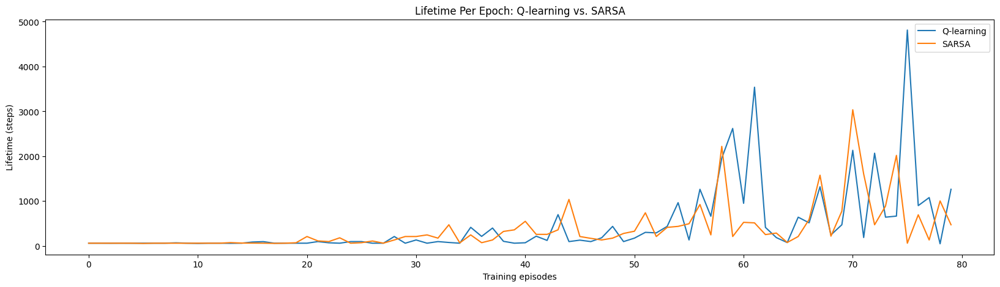

In [43]:
# plot life time against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))
plt.plot(range(len(lifetime_per_epoch_q)), lifetime_per_epoch_q, label='Q-learning')
plt.plot(range(len(lifetime_per_epoch_sarsa)), lifetime_per_epoch_sarsa, label='SARSA')
plt.xlabel('Training episodes')
plt.ylabel('Lifetime (steps)')
plt.title('Lifetime Per Epoch: Q-learning vs. SARSA')
plt.legend()
plt.show()


## Reward Per Epoch: SARSA vs. Q-learning
The cumulative reward results align closely with the lifetime per epoch, as the reward is directly tied to the number of pipes passed (+1 for passing a pipe, -5 for dying). Since survival time and reward are correlated, the trends in the two graphs are similar. SARSA exhibits consistent performance, while Q-learning shows more variability but occasionally reaches higher peaks.


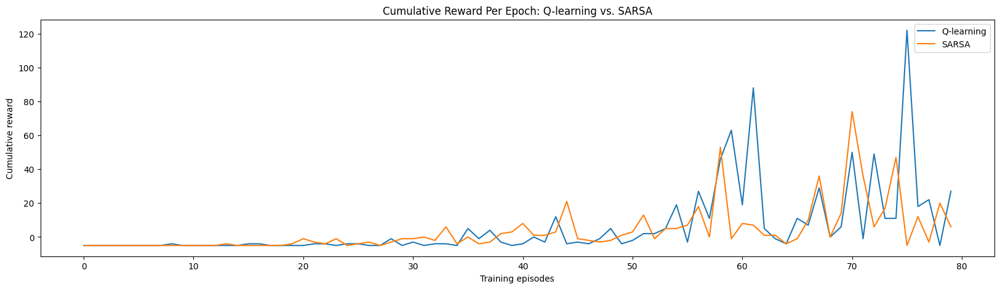

In [44]:
# plot reward against training episodes
fig, ax1 = plt.subplots(figsize=(20, 5))
plt.plot(range(len(reward_per_epoch_q)), reward_per_epoch_q, label='Q-learning')
plt.plot(range(len(reward_per_epoch_sarsa)), reward_per_epoch_sarsa, label='SARSA')
plt.xlabel('Training episodes')
plt.ylabel('Cumulative reward')
plt.title('Cumulative Reward Per Epoch: Q-learning vs. SARSA')
plt.legend()
plt.show()

### Alignment with Observed Results
The graphs support this theoretical distinction:
- **SARSA's stability** aligns with its conservative nature, as seen in the smoother trends in both lifetime and reward.
- **Q-learning's variability** reflects its tendency to exploit optimal actions, leading to higher peaks but less stability.

## Conclusion
SARSA is more reliable in environments like Flappy Bird, where stability is critical due to high variability in outcomes. However, Q-learning may outperform SARSA in specific scenarios where aggressive exploitation of the optimal policy is advantageous.